In [1]:
include("until.jl")

experiment_growth_rate_3D (generic function with 1 method)

## Heat map with various diffusion coefficient

Now we fix $d_3=0.01$ and study how the ratio of $\frac{d_1}{d_2}$ affects the value of PDE

In [74]:
Nₜ = 1.5:0.05:3
λ, ν = 0.7, 2
δ, g, m = 0.9, 2, 1/2
d₁, d₃, k = 1, 0.01, 7
d₂ = 0.002:0.001:0.05

ODE_eigen = zeros(Float64, length(Nₜ), length(d₂))
PDE_eigen = zeros(Float64, length(Nₜ), length(d₂))

for i in 1:length(d₂)
    for j in 1:length(Nₜ)
        ODE_eigen[j,i], PDE_eigen[j,i], _ = ODE_PDE_system_3D(Nₜ, λ, ν, δ, g, m, d₁, d₂[i], d₃, k)[j]
    end
end

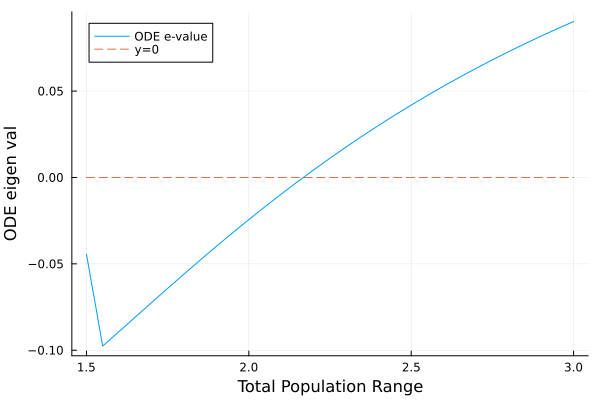

In [75]:
plot(Nₜ, ODE_eigen[:,1], xlabel="Total Population Range", ylabel="ODE eigen val", label="ODE e-value")
plot!(Nₜ, zeros(length(Nₜ)), label="y=0", linestyle=:dash)

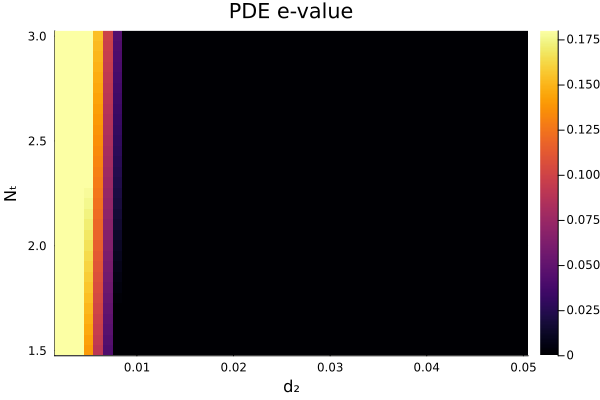

In [76]:
heatmap(d₂, Nₜ, PDE_eigen,
    xlabel = "d₂",
    ylabel = "Nₜ",
    title = "PDE e-value",  # Ensure aspect ratio is equal for clarity
    colorbar = true,clim = (0, 0.18),
)

In [29]:
## Get the graph of Equilibrium points for N, P and Z for variable total population


# Function to plot the equilibrium states
function plot_equilibrium(N_t, λ, ν, δ, g, m)

    N̄, P̄, Z̄= equilibrium_state_3D(Nₜ, λ, ν, δ, g, m)
    computational_sum=N̄+P̄+Z̄

    plot(N_t, N̄, label="N", lw=2)
    plot!(N_t, P̄, label="P", lw=2)
    plot!(N_t, Z̄, label="Z", lw=2)
    plot!(N_t,computational_sum,label="actual sum", linestyle=:dash)
    xlabel!("total population")
    ylabel!("Equilibrium Values")
    title!("Equilibrium Plot")
end


plot_equilibrium (generic function with 1 method)

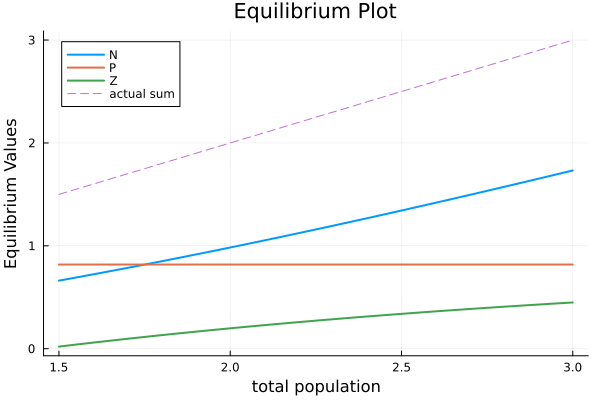

In [30]:
plot_equilibrium(Nₜ, λ, ν, δ, g, m)

## Parameter

From above heatmap and equilibrium plots, we decide to use the parameter as follows:

In [77]:
Nₜ = 1.5:0.05:3
λ, ν = 0.7, 2
δ, g, m = 0.9, 2, 1/2
d₁, d₂, d₃, k = 1, 0.002, 0.01, 7;

Determine the equilibrium points for 3 species

In [78]:
idx = findall(x -> x == 2, Nₜ)

## Use the following total population
total_population=Nₜ[idx]
total_population=total_population[1]


N̄, P̄, Z̄= equilibrium_state_3D(Nₜ, λ, ν, δ, g, m)

N̄, P̄, Z̄=N̄[idx][1], P̄[idx][1], Z̄[idx][1]


(0.9837162201752064, 0.8181818181818181, 0.19810196164297555)

## Initial conditions

In [79]:
## Pre-define the mode number k
k=7

function N_initial_cond(x)
    C₁=ODE_PDE_system_3D(total_population, λ, ν, δ, g, m, d₁, d₂, d₃, k)[1][4][1]
    N = N̄+1e-4*C₁*cos(k*x)
    return(N)
end


function P_initial_cond(x)
    C₂=ODE_PDE_system_3D(total_population, λ, ν, δ, g, m, d₁, d₂, d₃, k)[1][4][2]
    P = P̄+1e-4*C₂*cos(k*x)
    return(P)
end

function Z_initial_cond(x)
    C₃=ODE_PDE_system_3D(total_population, λ, ν, δ, g, m, d₁, d₂, d₃, k)[1][4][3]
    Z = Z̄+1e-4*C₃*cos(k*x)
    return(Z)
end

Z_initial_cond (generic function with 1 method)

## Initilize and Set up Model

In [80]:
## Initialize the model
NPZ_parameters =  ( d₁ = d₁,
                    d₂ = d₂,
                    d₃ = d₃,
                    ν = ν ,          
                    λ = λ ,
                    δ = δ,
                    g = g,
                    m = m
)



growth_P(z, t, N, P, Z, params) = params.ν * P * N / (N + 1)
death_P(z, t, N, P, Z, params)  = params.λ*(max(0, P))^(params.m)

growth_Z(z, t, N, P, Z, params) = params.g * Z * P / (P + 1)
death_Z(z, t, N, P, Z, params) = params.δ * Z






N_reaction(z, t, N, P, Z, params) = - growth_P(z, t, N, P, Z, params) + death_P(z, t, N, P, Z, params) + death_Z(z, t, N, P, Z, params) 
P_reaction(z, t, N, P, Z, params) =   growth_P(z, t, N, P, Z, params)  - death_P(z, t, N, P, Z, params) - growth_Z(z, t, N, P, Z, params)
Z_reaction(z, t, N, P, Z, paramss) =  growth_Z(z, t, N, P, Z, params) - death_Z(z, t, N, P, Z, params)


N_forcing = Forcing(N_reaction, field_dependencies = (:N, :P, :Z), parameters = NPZ_parameters)
P_forcing = Forcing(P_reaction, field_dependencies = (:N, :P, :Z), parameters = NPZ_parameters)
Z_forcing = Forcing(Z_reaction, field_dependencies = (:N, :P, :Z), parameters = NPZ_parameters)


grid    = RectilinearGrid(size=128, z=(0,2*π), topology=(Flat, Flat, Bounded))

diffusivities = NamedTuple{(:N, :P, :Z)}((NPZ_parameters.d₁, NPZ_parameters.d₂, NPZ_parameters.d₃))

closure = ScalarDiffusivity(κ=diffusivities)

model   = NonhydrostaticModel(; grid,
                             closure,
                             tracers = (:N, :P, :Z),
                             forcing = (N=N_forcing, P=P_forcing, Z_forcing)
                             )

NonhydrostaticModel{CPU, RectilinearGrid}(time = 0 seconds, iteration = 0)
├── grid: 1×1×128 RectilinearGrid{Float64, Flat, Flat, Bounded} on CPU with 0×0×3 halo
├── timestepper: RungeKutta3TimeStepper
├── advection scheme: Centered(order=2)
├── tracers: (N, P, Z)
├── closure: ScalarDiffusivity{ExplicitTimeDiscretization}(ν=0.0, κ=(N=1.0, P=0.002, Z=0.01))
├── buoyancy: Nothing
└── coriolis: Nothing

In [81]:
## Define the initial condition:
set!(model, N = N_initial_cond, P = P_initial_cond, Z = Z_initial_cond)
min_Δz = minimum_zspacing(model.grid)
diffusion_time_scale = min_Δz^2 / model.closure.κ.N

0.0024095713869847065

## Running Simulation

In [82]:
## Running simulation
max_time=40
simulation = Simulation(model, Δt = 0.1 * diffusion_time_scale, stop_time = max_time)

########################################

N, P, Z = model.tracers

perturbation_N(args...) = norm(N .- N̄)
perturbation_P(args...) = norm(P .- P̄)
perturbation_Z(args...) = norm(Z .- Z̄)

simulation.output_writers[:growth_NPZ] =
    NetCDFOutputWriter(model, (; perturbation_N, perturbation_P, perturbation_Z);
                     filename = "NPZgrowth.nc",
                     schedule = IterationInterval(10),
                     dimensions = (; perturbation_N = (),
                                     perturbation_P = (),
                                     perturbation_Z = ()),
                     overwrite_existing = true)

simulation.output_writers[:fields] =
    JLD2OutputWriter(model, model.tracers,
                     filename = "NPZ.jld2",
                     schedule=IterationInterval(200),
                     overwrite_existing = true)

run!(simulation)

┌ Warning: Overwriting existing d:\Master Research\Research-Project\NPZgrowth.nc.
└ @ Oceananigans.OutputWriters C:\Users\xiang\.julia\packages\Oceananigans\Y6Lmd\src\OutputWriters\netcdf_output_writer.jl:397
┌ Info: Initializing simulation...
└ @ Oceananigans.Simulations C:\Users\xiang\.julia\packages\Oceananigans\Y6Lmd\src\Simulations\run.jl:195
┌ Info:     ... simulation initialization complete (1.188 seconds)
└ @ Oceananigans.Simulations C:\Users\xiang\.julia\packages\Oceananigans\Y6Lmd\src\Simulations\run.jl:239
┌ Info: Executing initial time step...
└ @ Oceananigans.Simulations C:\Users\xiang\.julia\packages\Oceananigans\Y6Lmd\src\Simulations\run.jl:123
┌ Info:     ... initial time step complete (1.182 seconds).
└ @ Oceananigans.Simulations C:\Users\xiang\.julia\packages\Oceananigans\Y6Lmd\src\Simulations\run.jl:132
┌ Info: Simulation is stopping after running for 13.602 minutes.
└ @ Oceananigans.Simulations C:\Users\xiang\.julia\packages\Oceananigans\Y6Lmd\src\Simulations\simula

## Space Homogenious IC

In [33]:
N_data,P_data,Z_data,times,space= key_variable_outcome_3D(199, model, "NPZ.jld2");

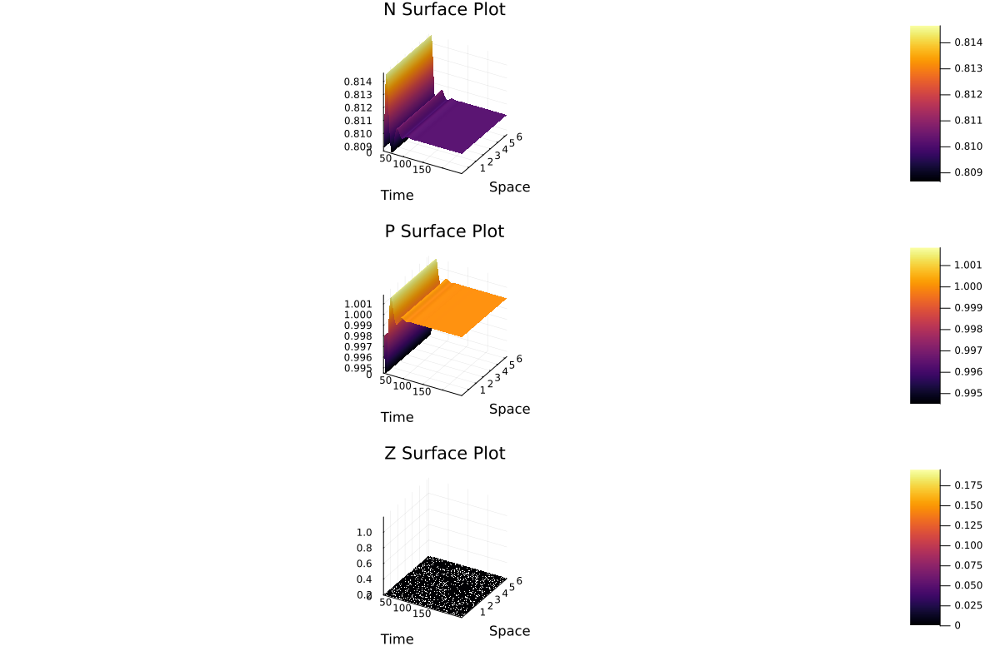

In [34]:
surface_plot_3D(N_data,P_data,Z_data,times,space)

## $\cos(3x)$ IC

In [39]:
N_data,P_data,Z_data,times,space= key_variable_outcome_3D(20, model, "NPZ.jld2");

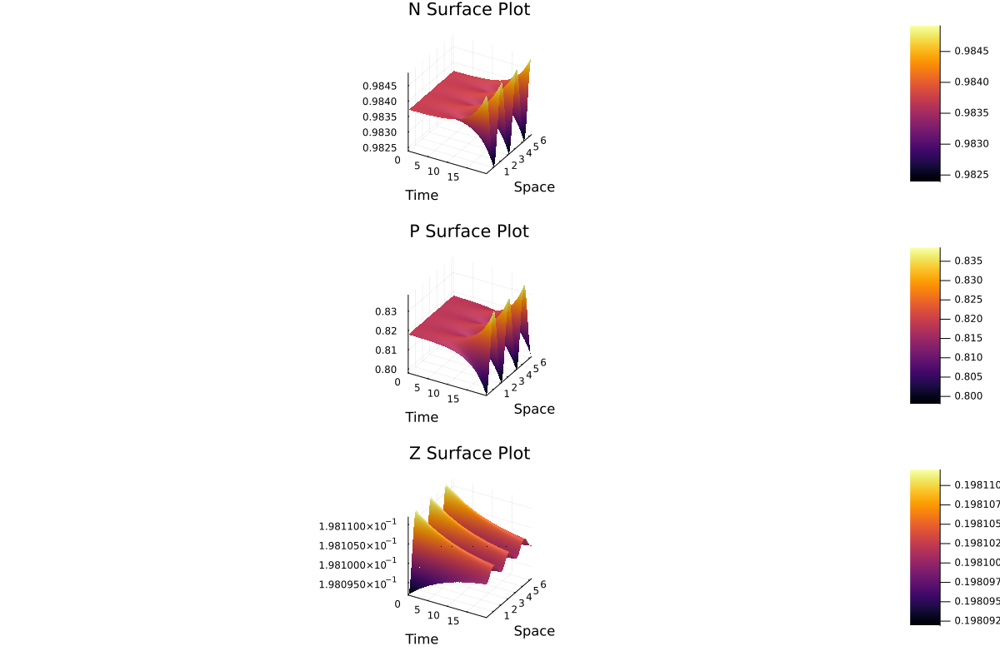

In [40]:
surface_plot_3D(N_data,P_data,Z_data,times,space)

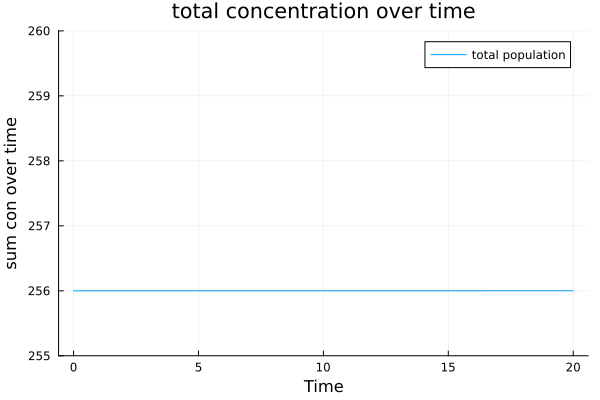

In [41]:
conservation_plot_3D(N_data,P_data,Z_data,times,space)

Growth rate of N is approximately 0.2542190626216192
Growth rate of P is approximately 0.21971972832784747
Growth rate of Z is approximately -0.08983747144176943
Largest real part of e-value 0.19147351723065445

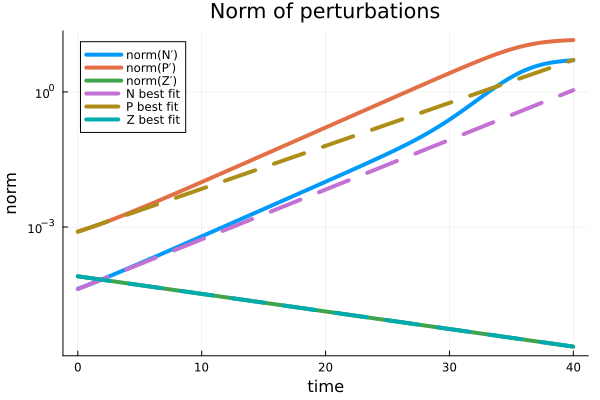

In [42]:
experiment_growth_rate_3D("NPZgrowth.nc",total_population, λ, ν, δ, g, m, d₁, d₂, d₃, k)

## $\cos(7x)$ IC

In [83]:
N_data,P_data,Z_data,times,space= key_variable_outcome_3D(20, model, "NPZ.jld2");

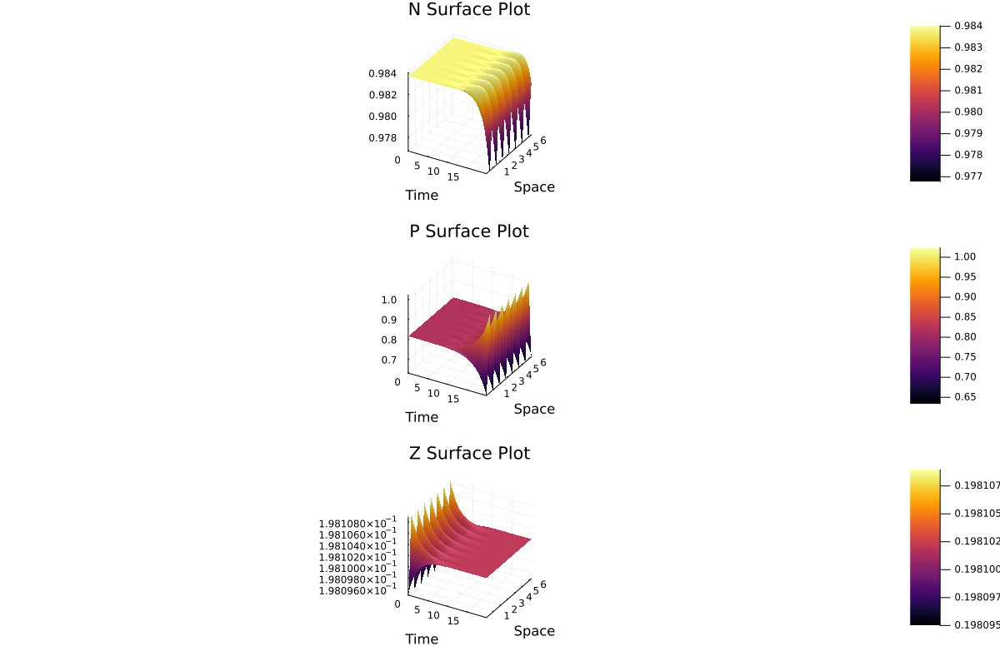

In [84]:
surface_plot_3D(N_data,P_data,Z_data,times,space)

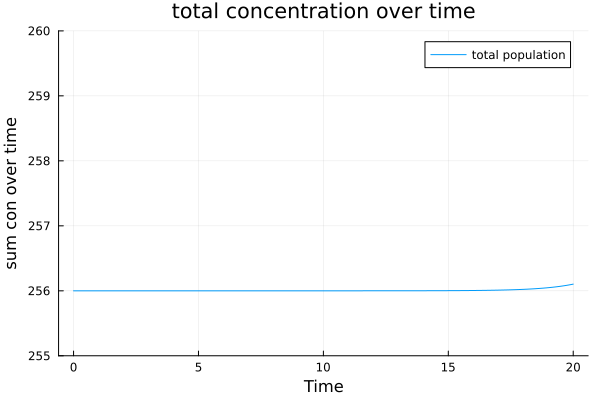

In [85]:
conservation_plot_3D(N_data,P_data,Z_data,times,space)

Growth rate of N is approximately 0.39365078527325476
Growth rate of P is approximately 0.360227839459021
Growth rate of Z is approximately -0.4851977835441941
Largest real part of e-value 0.31936730150087567

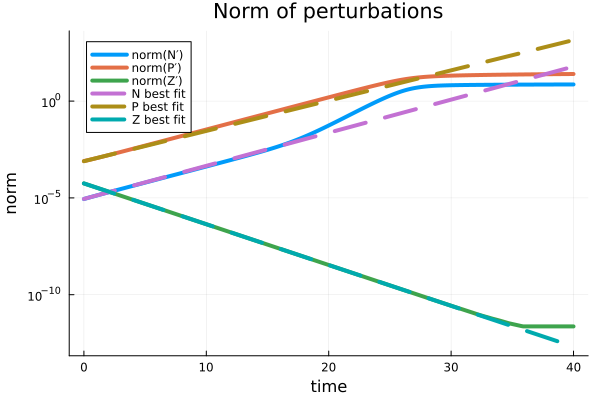

In [86]:
experiment_growth_rate_3D("NPZgrowth.nc",total_population, λ, ν, δ, g, m, d₁, d₂, d₃, k)